In [1]:
directory = '/content/RewardPlusWeightedReluCBF3/'
reward_name = '+1/step - max(0, 2*theta*omega + theta^2 - 0.01) - 0.01*max(0, 2*omega*alpha+ omega^2 - 0.01) \n - 0.01*max(0, 2va + v^2 - 0.01)'
!mkdir '/content/RewardPlusWeightedReluCBF3/'

In [2]:
!pip install tensorboardX

import random
from continuous_cartpole import ContinuousCartPoleEnv
import os
import sys
from tensorboardX import SummaryWriter
from torch.distributions import Normal
import torch.optim as optim
import torch.nn.functional as F
import torch.nn as nn
import torch
import gym
import math
import pandas as pd
import numpy as np
from itertools import count

env_path = os.path.join(os.path.abspath(os.getcwd()),
                        '..\\Environments\\ContinuousCartPole')
sys.path.append(env_path)

env = ContinuousCartPoleEnv()

mode = 'train'
env_name = "ContinuousCartPoleEnv"
tau = 0.005
target_update_interval = 1
test_iteration = 10

learning_rate = 1e-4
gamma = 0.99
capacity = 1000000
batch_size = 100
seed = False
random_seed = 9527

sample_frequency = 2000
render = False
log_interval = 50
load = False
render_interval = 100
exploration_noise = 0.1
noise_clip = 0.5
policy_noise = 0.2
policy_freq = 2
max_episode = 999  # maxep
print_log = 5
update_iteration = 200

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

if seed:
    env.seed(random_seed)
    torch.manual_seed(random_seed)
    np.random.seed(random_seed)

state_dim = env.observation_space.shape[0]
action_dim = env.action_space.shape[0]
max_action = float(env.action_space.high[0])
min_Val = torch.tensor(1e-7).float().to(device)


class Replay_buffer():
    '''
    Code based on:
    https://github.com/openai/baselines/blob/master/baselines/deepq/replay_buffer.py
    Expects tuples of (state, next_state, action, reward, done)
    '''

    def __init__(self, max_size=capacity):
        self.storage = []
        self.max_size = max_size
        self.ptr = 0

    def push(self, data):
        if len(self.storage) == self.max_size:
            self.storage[int(self.ptr)] = data
            self.ptr = (self.ptr + 1) % self.max_size
        else:
            self.storage.append(data)

    def sample(self, batch_size):
        ind = np.random.randint(0, len(self.storage), size=batch_size)
        x, y, u, r, d = [], [], [], [], []

        for i in ind:
            X, Y, U, R, D = self.storage[i]
            x.append(np.array(X, copy=False))
            y.append(np.array(Y, copy=False))
            u.append(np.array(U, copy=False))
            r.append(np.array(R, copy=False))
            d.append(np.array(D, copy=False))

        return np.array(x), np.array(y), np.array(u), np.array(r).reshape(-1, 1), np.array(d).reshape(-1, 1)


class Actor(nn.Module):
    def __init__(self, state_dim, action_dim, max_action):
        super(Actor, self).__init__()

        self.l1 = nn.Linear(state_dim, 400)
        self.l2 = nn.Linear(400, 300)
        self.l3 = nn.Linear(300, action_dim)

        self.max_action = max_action

    def forward(self, x):
        x = F.relu(self.l1(x))
        x = F.relu(self.l2(x))
        x = self.max_action * torch.tanh(self.l3(x))
        return x


class Critic(nn.Module):
    def __init__(self, state_dim, action_dim):
        super(Critic, self).__init__()

        self.l1 = nn.Linear(state_dim + action_dim, 400)
        self.l2 = nn.Linear(400, 300)
        self.l3 = nn.Linear(300, 1)

        self.l4 = nn.Linear(state_dim + action_dim, 400)
        self.l5 = nn.Linear(400, 300)
        self.l6 = nn.Linear(300, 1)

    def forward(self, x, u):
        x1 = F.relu(self.l1(torch.cat([x, u], 1)))
        x1 = F.relu(self.l2(x1))
        x1 = self.l3(x1)

        x2 = F.relu(self.l4(torch.cat([x, u], 1)))
        x2 = F.relu(self.l5(x2))
        x2 = self.l6(x2)
        return x1, x2

    def Q1(self, x, u):
        xu = torch.cat([x, u], 1)

        x1 = F.relu(self.l1(xu))
        x1 = F.relu(self.l2(x1))
        x1 = self.l3(x1)
        return x1


class DDPG(object):
    def __init__(self, state_dim, action_dim, max_action):
        self.actor = Actor(state_dim, action_dim, max_action).to(device)
        self.actor_target = Actor(state_dim, action_dim, max_action).to(device)
        self.actor_target.load_state_dict(self.actor.state_dict())
        self.actor_optimizer = optim.Adam(self.actor.parameters(), lr=1e-4)

        self.critic = Critic(state_dim, action_dim).to(device)
        self.critic_target = Critic(state_dim, action_dim).to(device)
        self.critic_target.load_state_dict(self.critic.state_dict())
        self.critic_optimizer = optim.Adam(self.critic.parameters(), lr=1e-3)
        self.replay_buffer = Replay_buffer()
        self.writer = SummaryWriter(directory)

        self.num_critic_update_iteration = 0
        self.num_actor_update_iteration = 0
        self.num_training = 0

    def select_action(self, state, exploration_noise=0.1):
        state = torch.FloatTensor(state.reshape(1, -1)).to(device)
        action = self.actor(state).cpu().data.numpy().flatten()
        if exploration_noise != 0:
            action = (action + np.random.normal(0, exploration_noise,
                      size=env.action_space.shape[0]))
        return action.clip(env.action_space.low, env.action_space.high)

    def update(self):

        for it in range(update_iteration):
            # Sample replay buffer
            x, y, u, r, d = self.replay_buffer.sample(batch_size)
            state = torch.FloatTensor(x).to(device)
            action = torch.FloatTensor(u).to(device)
            next_state = torch.FloatTensor(y).to(device)
            done = torch.FloatTensor(1-d).to(device)
            reward = torch.FloatTensor(r).to(device)

            noise = torch.FloatTensor(u).data.normal_(
                0, policy_noise).to(device)
            noise = noise.clamp(-noise_clip, noise_clip)
            next_action = (self.actor_target(
                next_state) + noise).clamp(-2.0, 2.0)

            # Compute the target Q value
            target_Q1, target_Q2 = self.critic_target(next_state, next_action)
            target_Q = torch.min(target_Q1, target_Q2)
            target_Q = reward + (done * gamma * target_Q).detach()

            # Get current Q estimates
            current_Q1, current_Q2 = self.critic(state, action)

            # Compute critic loss
            critic_loss = F.mse_loss(
                current_Q1, target_Q) + F.mse_loss(current_Q2, target_Q)
            self.writer.add_scalar(
                'Loss/critic_loss', critic_loss, global_step=self.num_critic_update_iteration)
            # Optimize the critic
            self.critic_optimizer.zero_grad()
            critic_loss.backward()
            self.critic_optimizer.step()
            self.num_critic_update_iteration += 1

            if it % policy_freq == 0:
                # Compute actor loss
                actor_loss = -self.critic.Q1(state, self.actor(state)).mean()

                # Optimize the actor
                self.actor_optimizer.zero_grad()
                actor_loss.backward()
                self.actor_optimizer.step()

                # Update the frozen target models
                for param, target_param in zip(self.critic.parameters(), self.critic_target.parameters()):
                    target_param.data.copy_(
                        tau * param.data + (1 - tau) * target_param.data)

                for param, target_param in zip(self.actor.parameters(), self.actor_target.parameters()):
                    target_param.data.copy_(
                        tau * param.data + (1 - tau) * target_param.data)

                self.num_actor_update_iteration += 1

    def save(self):
        torch.save(self.actor.state_dict(), directory + 'actor.pth')
        torch.save(self.critic.state_dict(), directory + 'critic.pth')

    def load(self):
        self.actor.load_state_dict(torch.load(directory + 'actor.pth'))
        self.critic.load_state_dict(torch.load(directory + 'critic.pth'))


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 125 kB 24.8 MB/s 


/usr/local/lib/python3.7/dist-packages/gym/spaces/box.py:128: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(f"Box bound precision lowered by casting to {self.dtype}")


In [3]:
seeds = [61]
train_count = 0
train_thresh = 200
mode = 'train'
for i in range(len(seeds)):
    random_seed = seeds[i]
    env.seed(random_seed)
    torch.manual_seed(random_seed)
    np.random.seed(random_seed)
    agent = DDPG(state_dim, action_dim, max_action)
    ep_r = 0
    if (mode == 'train'):
        if load:
            agent.load()
        print("Seed Value:-", random_seed)
        for i in range(max_episode):
            energy_per_ep = []
            temp_energy = 0
            total_energy = 0
            total_reward = 0
            step = 0
            stepsInEachEp = 0
            rewards_per_step_list = []
            thetaValue = []
            thetaDotVal = []
            state = env.reset()
            for t in range(1000):
                action = agent.select_action(state, exploration_noise=0.2)
                next_state, reward, done, info = env.step(action)

                temp_energy = abs(30*action[0]*((next_state[0] - state[0])+(
                    0.05/1.1)*(math.sin(next_state[2]) - math.sin(state[2]))))
                total_energy += temp_energy
                alpha = state[3] * (next_state[3] - state[3]) / \
                    (next_state[2] - state[2])
                acc = state[1] * (next_state[1] - state[1]) / \
                    (next_state[0] - state[0])

                EnergyPenalty = - temp_energy
                cbf1 = (
                    (-2 * next_state[2] * next_state[3]) - ((next_state[2])**2) + 0.01)
                ReluCBF1 = - \
                    max(0.0, 2 * next_state[2] *
                        next_state[3] + (next_state[2])**2 - 0.01)
                ReluCBF2 = -max(0.0, 2 * next_state[2] * next_state[3] + (next_state[2])**2 - 0.01)-max(
                    0.0, 2 * next_state[3] * alpha + (next_state[3])**2 - 0.01)
                ReluCBF3 = -max(0.0, 2 * next_state[2] * next_state[3] + (next_state[2])**2 - 0.01)-0.01*max(
                    0.0, 2 * next_state[3] * alpha + (next_state[3])**2 - 0.01)-0.01*max(0.0, 2 * next_state[1] * acc + (next_state[1])**2 - 0.01)

                custom_reward = reward + ReluCBF3
                agent.replay_buffer.push(
                    (state, next_state, action, custom_reward, np.float64(done)))

                state = next_state
                step += 1

                total_reward += custom_reward

                rewards_per_step_list.append(reward)
                if (done):
                    break
            energy_per_ep.append(temp_energy)
            print(i+1, ",", total_reward, ",", total_energy, ",", step)
            if total_reward > 980:
                train_count = train_count + 1
            agent.update()
            if i % log_interval == 0:
                agent.save()
        env.close()


Seed Value:- 61
1 , -144.52982585643926 , 0.8048960345675382 , 22
2 , -372.25388083556635 , 135.46422754986335 , 32
3 , -287.73008121061616 , 48.453528875276874 , 26
4 , -124.5420628655753 , 28.332918548389944 , 91
5 , -141.12089293629916 , 5.060988131914691 , 25
6 , -171.7477251956221 , 58.199768258649144 , 30
7 , -41.39341830682762 , 52.03070369583521 , 45
8 , -333.99679835423825 , 78.92306129213891 , 26
9 , -371.75967390795086 , 94.1771649893578 , 35
10 , -274.6206148881981 , 134.26177803622923 , 38
11 , -148.2986528663533 , 18.9655912111148 , 35
12 , -148.9122490791628 , 31.059146481745007 , 48
13 , -326.46106551364625 , 94.53798708327487 , 86
14 , -144.758904360129 , 23.548926587476586 , 54
15 , -150.9804110460125 , 11.189523524280471 , 28
16 , -154.95771348454255 , 13.662139643725476 , 46
17 , -84.82920910640284 , 65.63927944475891 , 42
18 , -141.87295121425925 , 1.5841275166774915 , 23
19 , 50.342972100848115 , 36.82964800823783 , 93
20 , -101.11700088584625 , 15.993238971081512

In [4]:
!mkdir '/content/RewardPlusWeightedReluCBF3/v = 0'

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in double_scalars


-90 0.26670403215937327


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in double_scalars


-80 8.125932968731979


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in double_scalars


-70 37.575132766394816


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in double_scalars


-60 35.69586114301822


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in double_scalars


-50 38.6714292522771


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in double_scalars


-40 20.002829175239963


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in double_scalars


-30 11.84311766210906


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in double_scalars


-20 8.54066014302979


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in double_scalars


-10 8.287811721490268


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in double_scalars


0 4.773741501437893


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in double_scalars


10 6.834935108143071


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in double_scalars


20 9.40511041134515


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in double_scalars


30 13.980120588670163


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in double_scalars


40 20.37723227682959


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in double_scalars


50 40.42049913361283


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:53: RuntimeWarning: M

60 67.68925436324058


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


70 66.46135787977818


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


80 15.710404622586413


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


90 0.30582372679606357


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


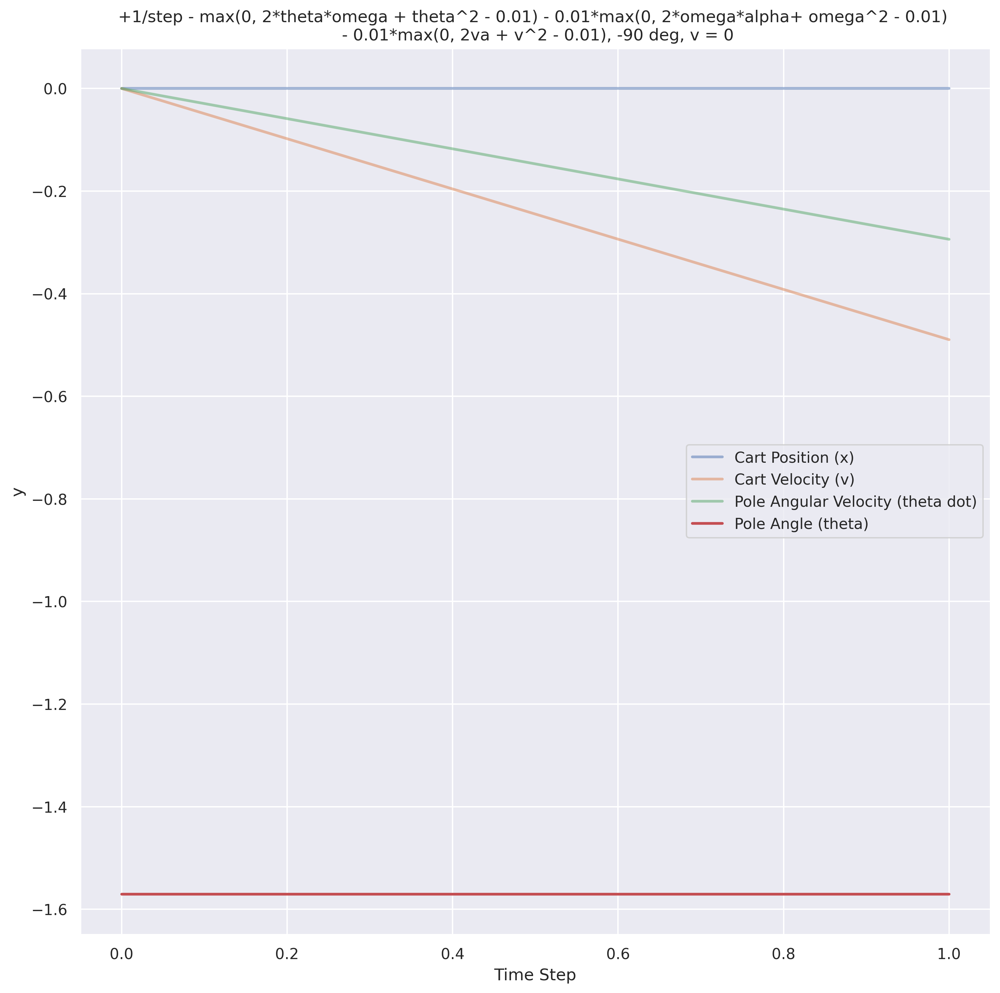

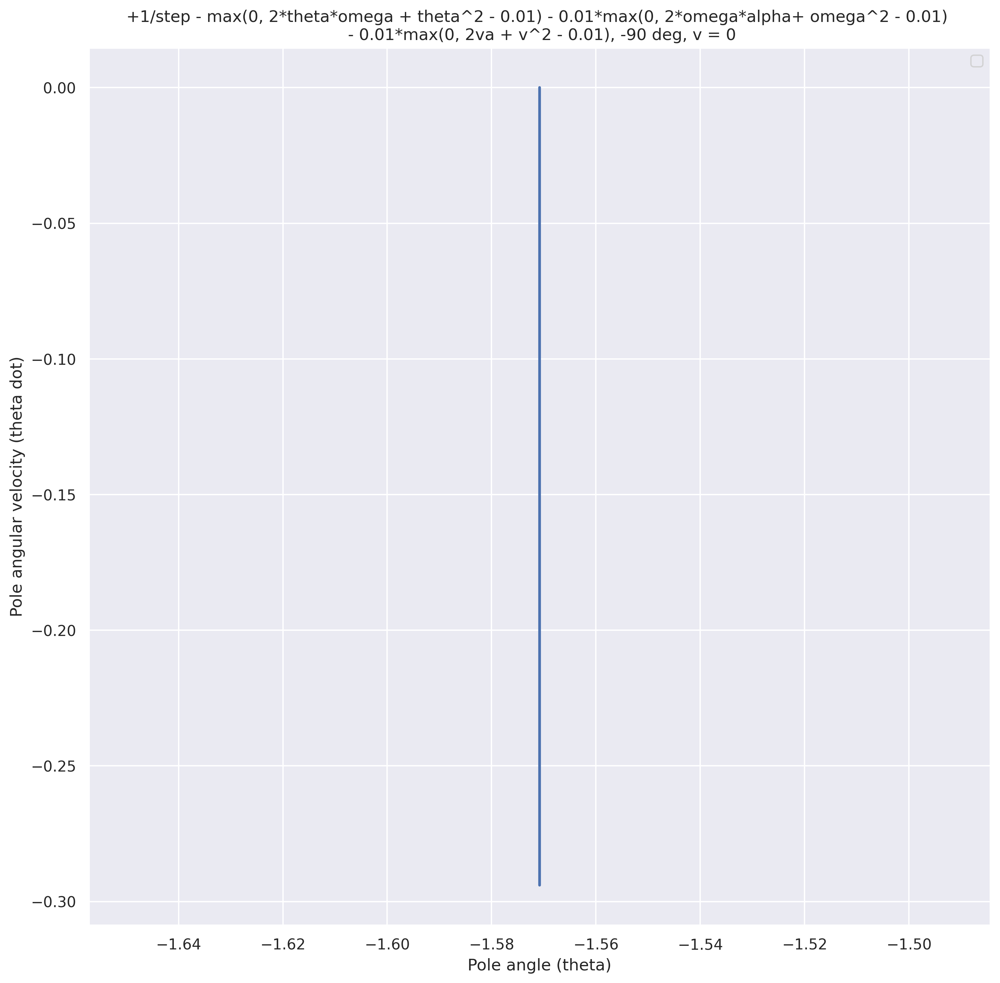

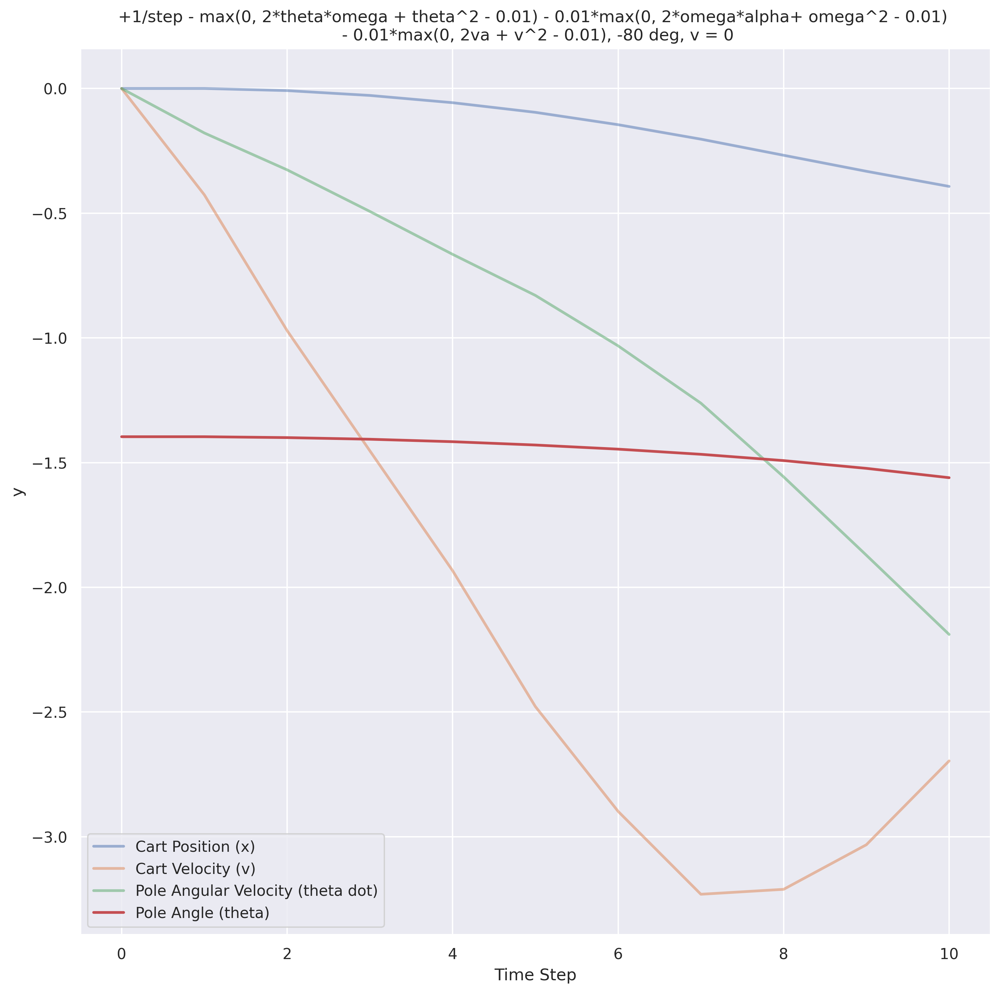

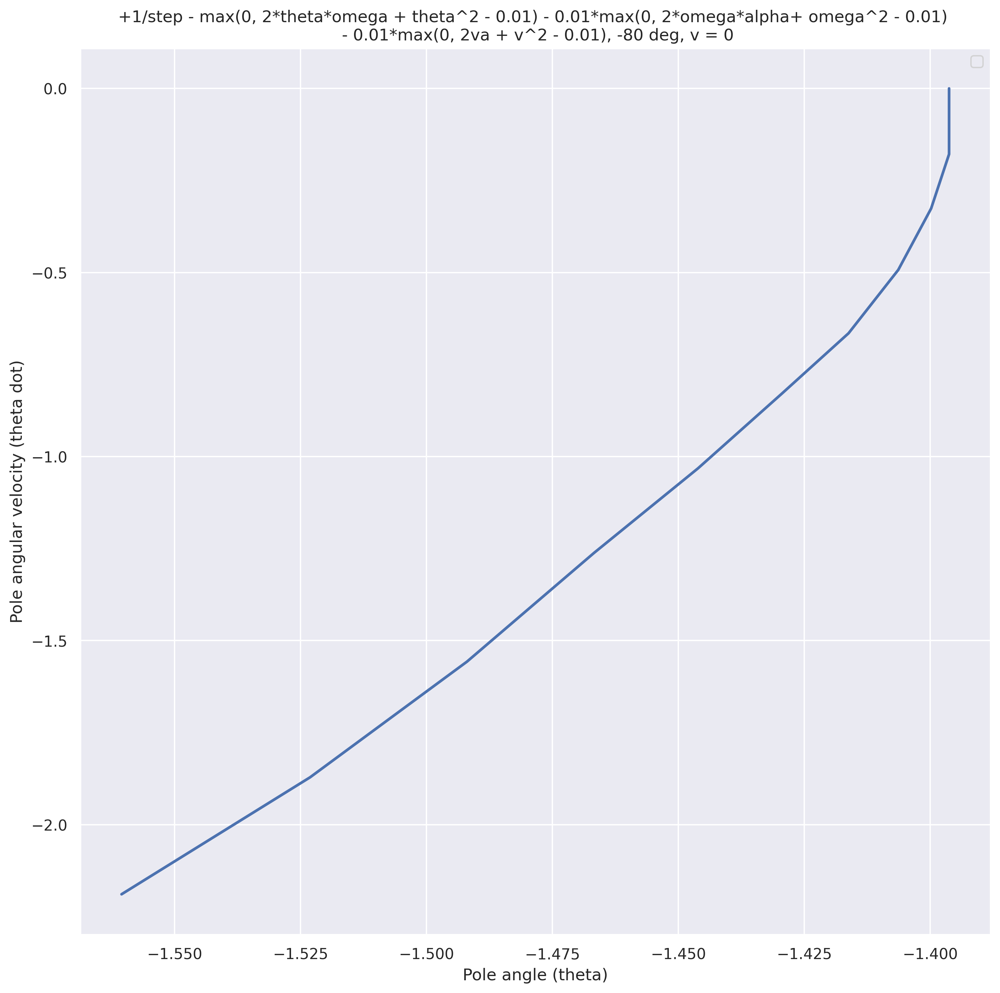

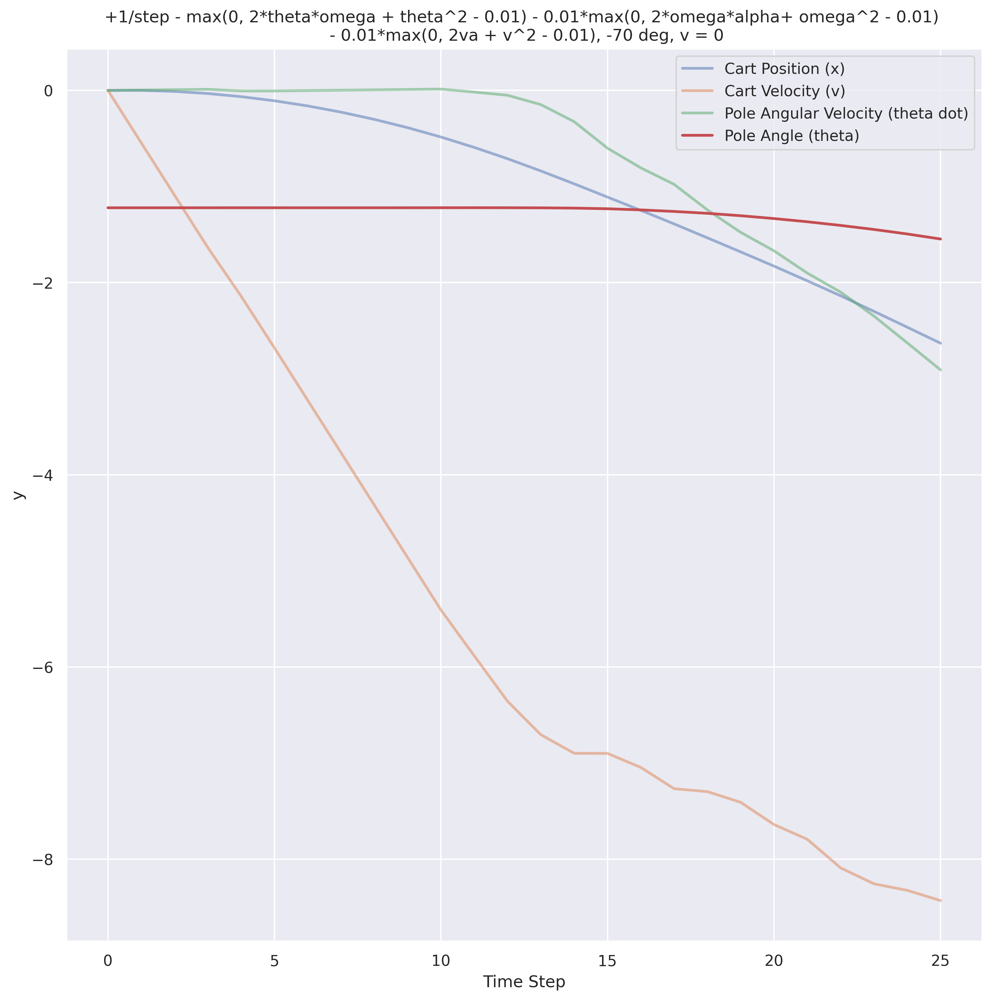

...

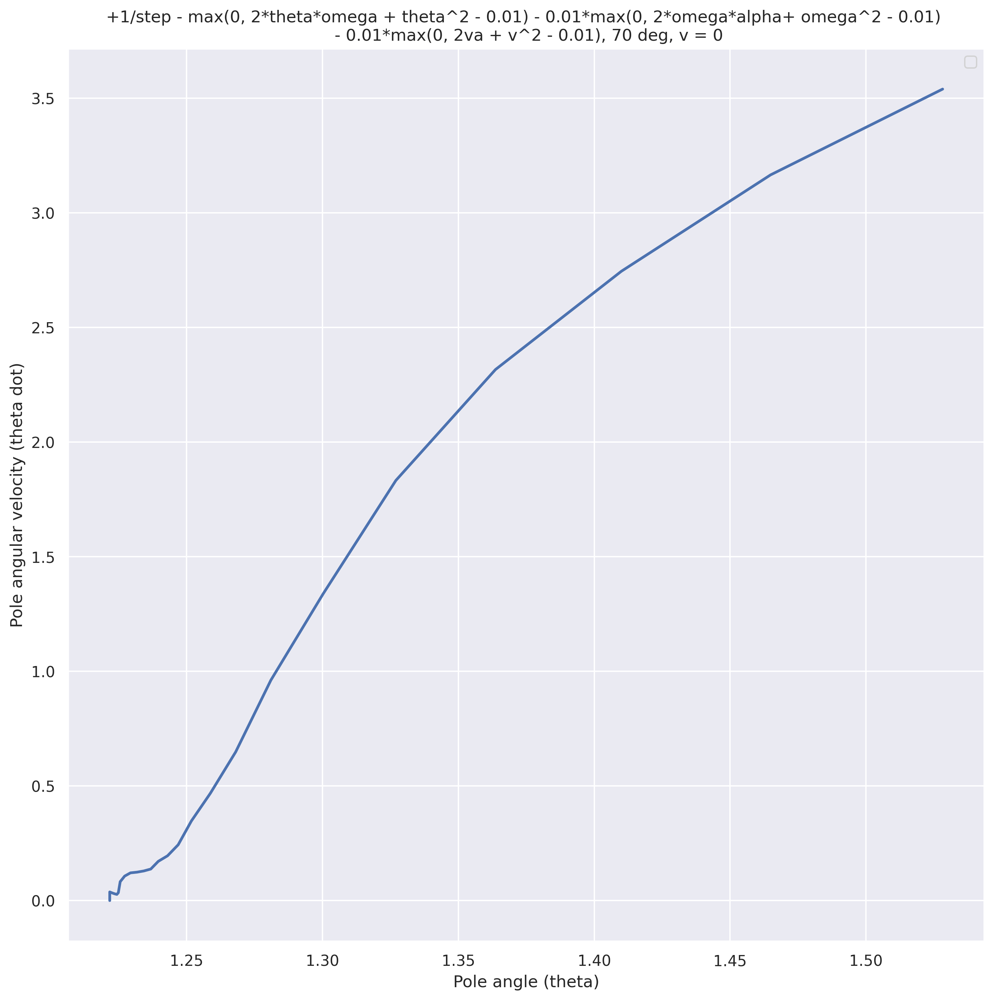

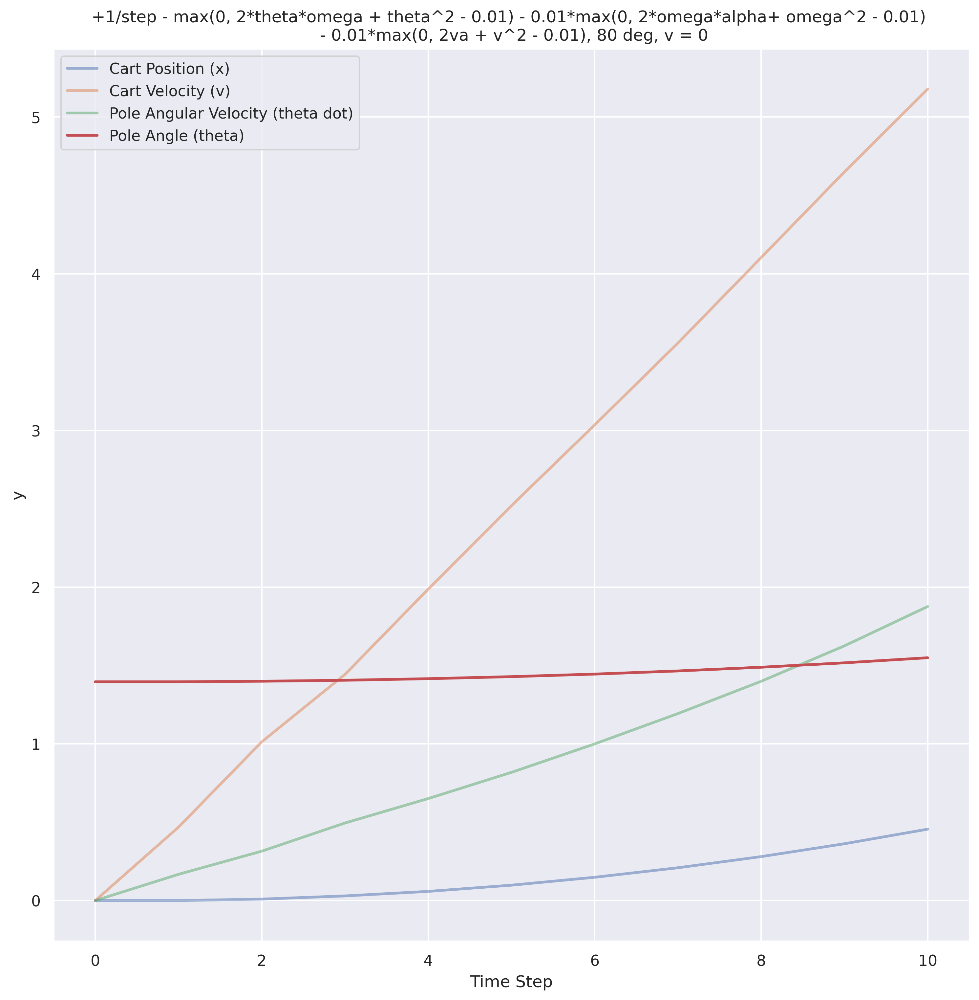

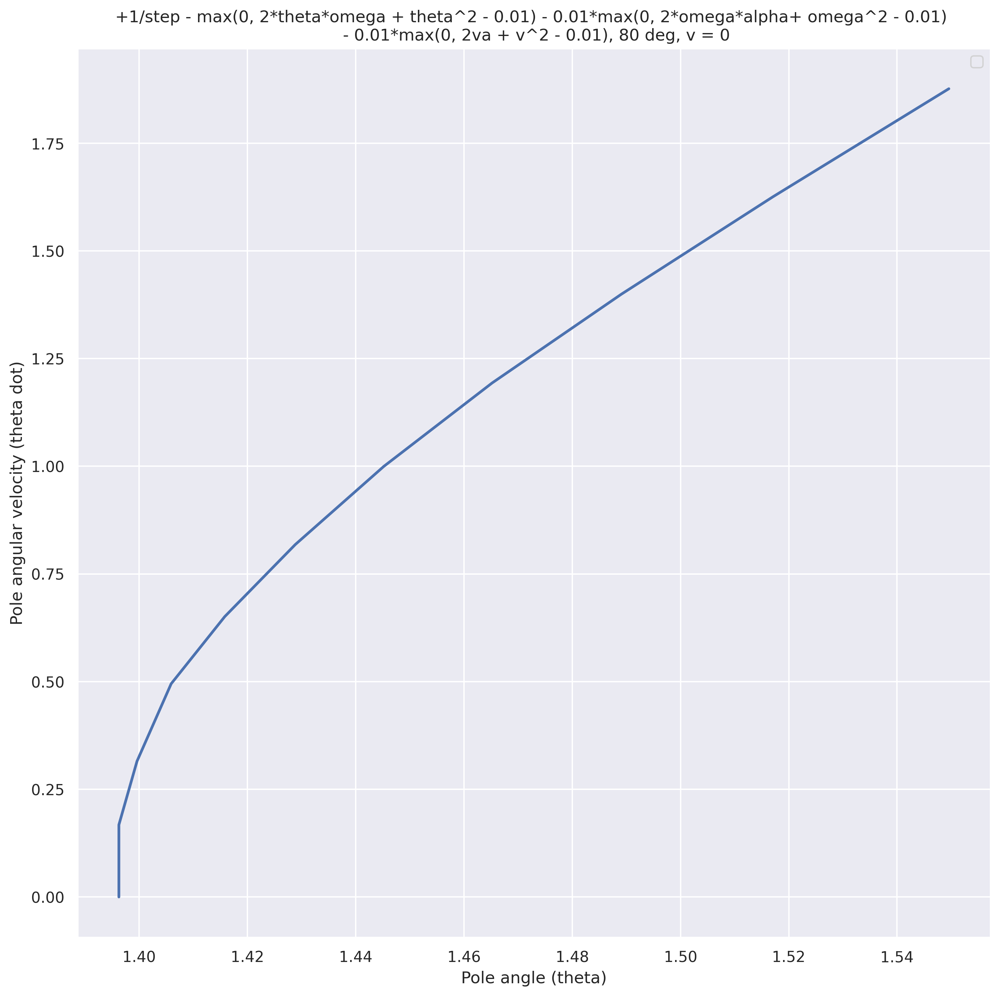

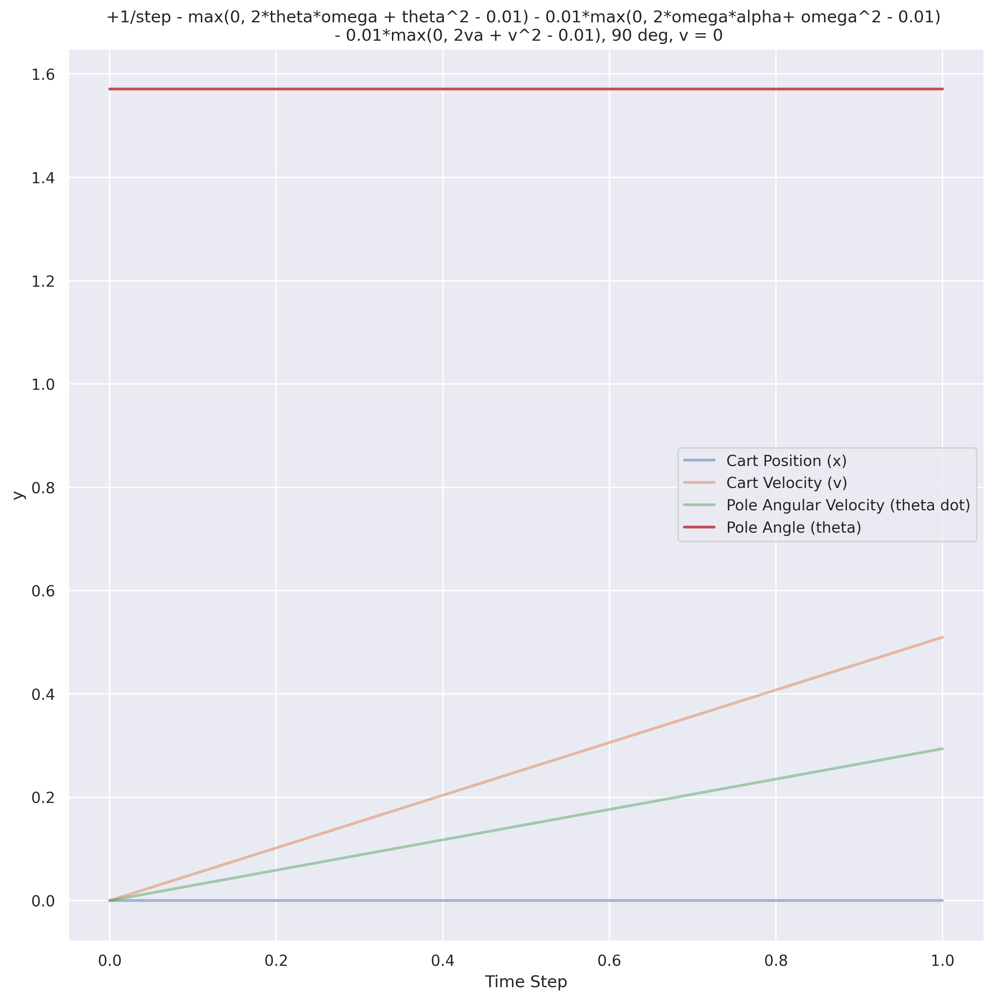

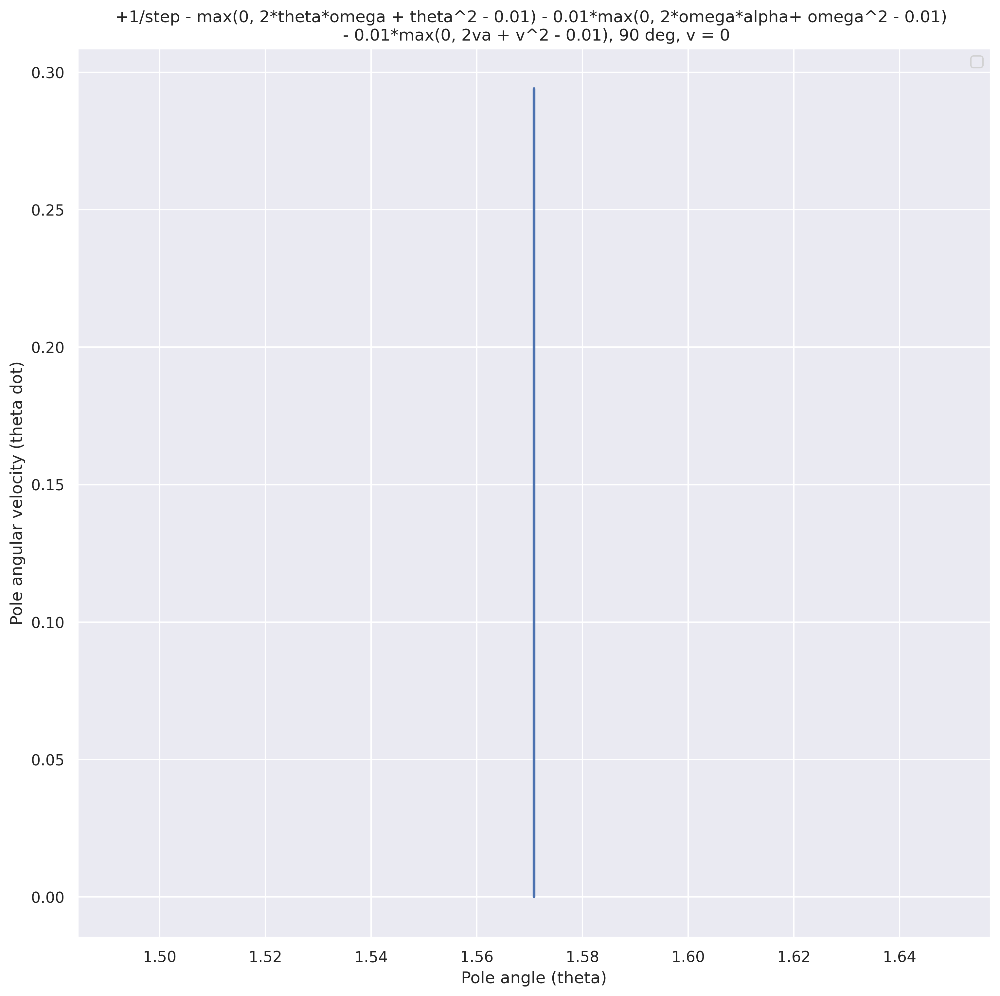

In [5]:
import gym
import random
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
import numpy as np
from sklearn.preprocessing import KBinsDiscretizer
import numpy as np
import time
import math
import random
from typing import Tuple
import pandas as pd

mode = 'test'
v_value = 'v = 0'
thetaVal = [-90, -80, -70, -60, -50, -40, -30, -
            20, -10, 0, 10, 20, 30, 40, 50, 60, 70, 80, 90]
test_iteration = 1
for theta in thetaVal:
    testdf = pd.DataFrame(columns=['X', 'v', 'theta', 'theta_dot', 'energy'])
    theta_rad = math.radians(theta)
    if mode == 'test':
        agent.load()
        for i in range(test_iteration):
            env.reset()
            state = env.state = env.unwrapped.state = np.array(
                [0, 0, theta_rad, 0])
            temp_energy = 0
            total_reward = 0
            for t in range(1000):
                action = agent.select_action(state)
                next_state, reward, done, info = env.step(np.float32(action))
                alpha = state[3] * (next_state[3] - state[3]) / \
                    (next_state[2] - state[2])
                acc = state[1] * (next_state[1] - state[1]) / \
                    (next_state[0] - state[0])
                temp_energy = abs(30*action[0]*((next_state[0] - state[0])+(
                    0.05/1.1)*(math.sin(next_state[2]) - math.sin(state[2]))))
                testdf.loc[len(testdf.index)] = [
                    state[0], state[1], state[2], state[3], temp_energy]
                if done or t >= 1000:
                    ep_r = 0
                    break
                state = next_state
    print(theta, testdf['energy'].sum())
    testdf.to_csv(directory + v_value + '/' + str(theta) + ' degrees.csv')
    sns.set()
    graphed_array = testdf['X']
    graphed_array1 = testdf['v']
    graphed_array2 = testdf['theta']
    graphed_array3 = testdf['theta_dot']
    plt.figure(figsize=(12, 12), dpi=300)
    plt.plot(graphed_array, label='Cart Position (x)', linewidth=2, alpha=0.5)
    plt.plot(graphed_array1, label='Cart Velocity (v)', linewidth=2, alpha=0.5)
    plt.plot(graphed_array3, label='Pole Angular Velocity (theta dot)',
             linewidth=2, alpha=0.5)
    plt.plot(graphed_array2, label='Pole Angle (theta)', linewidth=2, alpha=1)
    plt.ylabel('y')
    plt.xlabel('Time Step')
    plt.title(reward_name + ', ' + str(theta) + ' deg, ' + v_value)
    plt.axis((None, None, None, None))
    x = np.linspace(0, 1000)
    plt.legend()
    plt.savefig(directory + v_value + '/' + str(theta) + ' deg.png')
    plt.figure(figsize=(12, 12), dpi=300)
    plt.plot(graphed_array2, graphed_array3, linewidth=2)
    plt.ylabel('Pole angular velocity (theta dot)')
    plt.xlabel('Pole angle (theta)')
    plt.title(reward_name + ', ' + str(theta) + ' deg, ' + v_value)
    plt.axis((None, None, None, None))
    plt.legend()
    plt.savefig(directory + v_value + '/' + str(theta) + ' deg tvt.png')


In [6]:
!zip -r /content/RewardPlusWeightedReluCBF3.zip /content/RewardPlusWeightedReluCBF3/

  adding: content/RewardPlusWeightedReluCBF3/ (stored 0%)
  adding: content/RewardPlusWeightedReluCBF3/events.out.tfevents.1668428333.d19dbe3d76a3 (deflated 72%)
  adding: content/RewardPlusWeightedReluCBF3/critic.pth (deflated 6%)
  adding: content/RewardPlusWeightedReluCBF3/actor.pth (deflated 7%)
  adding: content/RewardPlusWeightedReluCBF3/v = 0/ (stored 0%)
  adding: content/RewardPlusWeightedReluCBF3/v = 0/-90 deg tvt.png (deflated 36%)
  adding: content/RewardPlusWeightedReluCBF3/v = 0/-80 deg tvt.png (deflated 25%)
  adding: content/RewardPlusWeightedReluCBF3/v = 0/10 deg.png (deflated 7%)
  adding: content/RewardPlusWeightedReluCBF3/v = 0/50 deg tvt.png (deflated 18%)
  adding: content/RewardPlusWeightedReluCBF3/v = 0/-40 deg.png (deflated 12%)
  adding: content/RewardPlusWeightedReluCBF3/v = 0/20 degrees.csv (deflated 53%)
  adding: content/RewardPlusWeightedReluCBF3/v = 0/-10 deg.png (deflated 7%)
  adding: content/RewardPlusWeightedReluCBF3/v = 0/-50 deg tvt.png (deflated 1